In [88]:
words = open("names.txt", 'r').read().splitlines()

In [89]:
b = {}
for w in words:
    # Add start and ending characters
    chs = ["<S>"] + list(w) + ["<E>"] 
    # Get pairs of characters in a sliding window and add to dict
    for ch1, ch2 in zip(chs, chs[1:]):
        bigram = (ch1, ch2)
        b[bigram] = b.get(bigram, 0) + 1

In [90]:
# Sort by highest occurence
sorted(b.items(), key = lambda kv: kv[1], reverse = True)

[(('n', '<E>'), 6763),
 (('a', '<E>'), 6640),
 (('a', 'n'), 5438),
 (('<S>', 'a'), 4410),
 (('e', '<E>'), 3983),
 (('a', 'r'), 3264),
 (('e', 'l'), 3248),
 (('r', 'i'), 3033),
 (('n', 'a'), 2977),
 (('<S>', 'k'), 2963),
 (('l', 'e'), 2921),
 (('e', 'n'), 2675),
 (('l', 'a'), 2623),
 (('m', 'a'), 2590),
 (('<S>', 'm'), 2538),
 (('a', 'l'), 2528),
 (('i', '<E>'), 2489),
 (('l', 'i'), 2480),
 (('i', 'a'), 2445),
 (('<S>', 'j'), 2422),
 (('o', 'n'), 2411),
 (('h', '<E>'), 2409),
 (('r', 'a'), 2356),
 (('a', 'h'), 2332),
 (('h', 'a'), 2244),
 (('y', 'a'), 2143),
 (('i', 'n'), 2126),
 (('<S>', 's'), 2055),
 (('a', 'y'), 2050),
 (('y', '<E>'), 2007),
 (('e', 'r'), 1958),
 (('n', 'n'), 1906),
 (('y', 'n'), 1826),
 (('k', 'a'), 1731),
 (('n', 'i'), 1725),
 (('r', 'e'), 1697),
 (('<S>', 'd'), 1690),
 (('i', 'e'), 1653),
 (('a', 'i'), 1650),
 (('<S>', 'r'), 1639),
 (('a', 'm'), 1634),
 (('l', 'y'), 1588),
 (('<S>', 'l'), 1572),
 (('<S>', 'c'), 1542),
 (('<S>', 'e'), 1531),
 (('j', 'a'), 1473),
 (

In [91]:
import torch

In [92]:
N = torch.zeros((27, 27), dtype = torch.int32)

In [93]:
# Get all letters of the alphabet in a list
chars = sorted(list(set(''.join(words))))

# Create mapping
s_to_i = {s:i for i, s in enumerate(chars, start=1)}
s_to_i['.'] = 0
s_to_i

# Reverse Mapping
i_to_s = {i:s for s, i in s_to_i.items()}
i_to_s

{1: 'a',
 2: 'b',
 3: 'c',
 4: 'd',
 5: 'e',
 6: 'f',
 7: 'g',
 8: 'h',
 9: 'i',
 10: 'j',
 11: 'k',
 12: 'l',
 13: 'm',
 14: 'n',
 15: 'o',
 16: 'p',
 17: 'q',
 18: 'r',
 19: 's',
 20: 't',
 21: 'u',
 22: 'v',
 23: 'w',
 24: 'x',
 25: 'y',
 26: 'z',
 0: '.'}

In [94]:
for w in words:
    # Add start and ending characters
    chs = ["."] + list(w) + ["."] 
    # Get pairs of characters in a sliding window and add to dict
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = s_to_i[ch1]
        ix2 = s_to_i[ch2]
        N[ix1, ix2] += 1

(np.float64(-0.5), np.float64(26.5), np.float64(26.5), np.float64(-0.5))

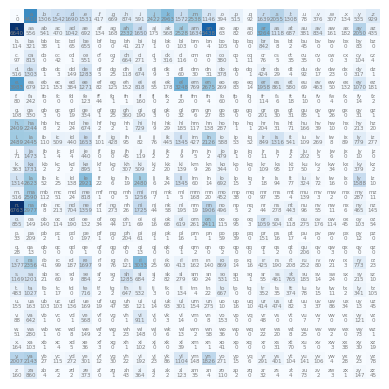

In [95]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.imshow(N, cmap='Blues')

for i in range(27):
    for j in range(27):
        chstr = i_to_s[i] + i_to_s[j]
        plt.text(j, i, chstr, ha="center", va="bottom", color="gray", fontsize='4')
        plt.text(j, i, N[i, j].item(), ha="center", va="top", color="gray", fontsize='4')

plt.axis('off')

In [96]:
N[0]

tensor([   0, 4410, 1306, 1542, 1690, 1531,  417,  669,  874,  591, 2422, 2963,
        1572, 2538, 1146,  394,  515,   92, 1639, 2055, 1308,   78,  376,  307,
         134,  535,  929], dtype=torch.int32)

In [97]:
p = N[0].float()
p = p / p.sum()
p

tensor([0.0000, 0.1377, 0.0408, 0.0481, 0.0528, 0.0478, 0.0130, 0.0209, 0.0273,
        0.0184, 0.0756, 0.0925, 0.0491, 0.0792, 0.0358, 0.0123, 0.0161, 0.0029,
        0.0512, 0.0642, 0.0408, 0.0024, 0.0117, 0.0096, 0.0042, 0.0167, 0.0290])

In [98]:
# We do +1 to smooth the model and prevent -inf prob from log
P = (N+1).float()
# Sum each row of the vector, and return sum in column (1) format
# Keep dim is True to hold dimensions and will be used for broadcasting
P /= P.sum(1, keepdim=True) # /= is faster because in place and doesn't create new memory
P[0].sum()

tensor(1.)

In [99]:
# Generator for multimonial
g = torch.Generator().manual_seed(214748)

for i in range(10):
    out = []
    ix = 0
    while True:

        p = P[ix] # Made code below more efficient on top
        # p = N[ix].float()
        # Get prob for each p (first letter)
        # p = p / p.sum()
        # print(p)
        
        # draw random samples from a dataset where some items are more likely to be picked than others
        ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
        out.append(i_to_s[ix])
        if ix == 0:
            break
    print(''.join(out))
    

tteaha.
sin.
paladakionarava.
zaysyavaesseahanstritais.
tton.
ds.
dylelly.
pr.
derssca.
n.


In [100]:
# GOAL: maximise the likelihood of data w.r.t. model parameters
# equivalent to maximising log likelihood
# equivalent to minimising negative log likelihood
# equivalent to minmising the average nll 

# We use log because log(a * b * c) = log(a) + log(b) + log(c)

log_likelihood = 0.0
n = 0

for w in words:
    # Add start and ending characters
    chs = ["."] + list(w) + ["."] 
    # Get pairs of characters in a sliding window and add to dict
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = s_to_i[ch1]
        ix2 = s_to_i[ch2]
        prob = P[ix1, ix2]
        logprob = torch.log(prob)
        log_likelihood += logprob
        n += 1
        print(f'{ch1}{ch2}: {prob:.4f}{logprob:.4f}')

print(f'{log_likelihood=}')
nll = -log_likelihood
print(f'{nll=}')
print(f'{nll/n=}')


.e: 0.0478-3.0410
em: 0.0377-3.2793
mm: 0.0253-3.6753
ma: 0.3885-0.9454
a.: 0.1958-1.6305
.o: 0.0123-4.3965
ol: 0.0779-2.5526
li: 0.1774-1.7293
iv: 0.0152-4.1845
vi: 0.3508-1.0476
ia: 0.1380-1.9807
a.: 0.1958-1.6305
.a: 0.1376-1.9835
av: 0.0246-3.7041
va: 0.2473-1.3971
a.: 0.1958-1.6305
.i: 0.0185-3.9919
is: 0.0743-2.5998
sa: 0.1478-1.9119
ab: 0.0160-4.1363
be: 0.2455-1.4044
el: 0.1589-1.8396
ll: 0.0962-2.3408
la: 0.1876-1.6733
a.: 0.1958-1.6305
.s: 0.0641-2.7468
so: 0.0654-2.7270
op: 0.0121-4.4180
ph: 0.1947-1.6364
hi: 0.0955-2.3485
ia: 0.1380-1.9807
a.: 0.1958-1.6305
.c: 0.0481-3.0339
ch: 0.1869-1.6774
ha: 0.2937-1.2251
ar: 0.0963-2.3405
rl: 0.0325-3.4256
lo: 0.0496-3.0047
ot: 0.0149-4.2032
tt: 0.0670-2.7031
te: 0.1281-2.0549
e.: 0.1948-1.6357
.m: 0.0792-2.5358
mi: 0.1885-1.6687
ia: 0.1380-1.9807
a.: 0.1958-1.6305
.a: 0.1376-1.9835
am: 0.0482-3.0321
me: 0.1228-2.0971
el: 0.1589-1.8396
li: 0.1774-1.7293
ia: 0.1380-1.9807
a.: 0.1958-1.6305
.h: 0.0273-3.6011
ha: 0.2937-1.2251
ar: 0.0963

## Full Run

In [101]:
# create a training set for the bigrams (x,y)
xs, ys = [], []

for w in words:
    # Add start and ending characters
    chs = ["."] + list(w) + ["."] 
    # Get pairs of characters in a sliding window and add to dict
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = s_to_i[ch1]
        ix2 = s_to_i[ch2]
        print(ch1, ch2)
        xs.append(ix1)
        ys.append(ix2)

xs = torch.tensor(xs)
ys = torch.tensor(ys)
num = xs.nelement()

. e
e m
m m
m a
a .
. o
o l
l i
i v
v i
i a
a .
. a
a v
v a
a .
. i
i s
s a
a b
b e
e l
l l
l a
a .
. s
s o
o p
p h
h i
i a
a .
. c
c h
h a
a r
r l
l o
o t
t t
t e
e .
. m
m i
i a
a .
. a
a m
m e
e l
l i
i a
a .
. h
h a
a r
r p
p e
e r
r .
. e
e v
v e
e l
l y
y n
n .
. a
a b
b i
i g
g a
a i
i l
l .
. e
e m
m i
i l
l y
y .
. e
e l
l i
i z
z a
a b
b e
e t
t h
h .
. m
m i
i l
l a
a .
. e
e l
l l
l a
a .
. a
a v
v e
e r
r y
y .
. s
s o
o f
f i
i a
a .
. c
c a
a m
m i
i l
l a
a .
. a
a r
r i
i a
a .
. s
s c
c a
a r
r l
l e
e t
t t
t .
. v
v i
i c
c t
t o
o r
r i
i a
a .
. m
m a
a d
d i
i s
s o
o n
n .
. l
l u
u n
n a
a .
. g
g r
r a
a c
c e
e .
. c
c h
h l
l o
o e
e .
. p
p e
e n
n e
e l
l o
o p
p e
e .
. l
l a
a y
y l
l a
a .
. r
r i
i l
l e
e y
y .
. z
z o
o e
e y
y .
. n
n o
o r
r a
a .
. l
l i
i l
l y
y .
. e
e l
l e
e a
a n
n o
o r
r .
. h
h a
a n
n n
n a
a h
h .
. l
l i
i l
l l
l i
i a
a n
n .
. a
a d
d d
d i
i s
s o
o n
n .
. a
a u
u b
b r
r e
e y
y .
. e
e l
l l
l i
i e
e .
. s
s t


In [ ]:
import torch.nn.functional as F

# initialise the network
W = torch.randn(27, 27, requires_grad=True)

for k in range(100):
    # -- forward pass
    # xenc(5, 27), W = (27,27)
    xenc = F.one_hot(xs, num_classes=27).float()
    logits = (xenc @ W) # predicts log counts
    # this creates the softmax function
    counts = logits.exp()
    probs = counts / counts.sum(1, keepdim=True) # probs for next character
    loss = -probs[torch.arange(num), ys].log().mean() + 0.1 * (W**2).mean() # applying regularisation - way to penalise using large weights

    # -- backward pass
    W.grad = None # set to zero
    loss.backward()

    # -- update
    W.data += -50 * W.grad 
    print(loss)



tensor(3.7290, grad_fn=<NegBackward0>)
tensor(3.3810, grad_fn=<NegBackward0>)
tensor(3.1703, grad_fn=<NegBackward0>)
tensor(3.0356, grad_fn=<NegBackward0>)
tensor(2.9391, grad_fn=<NegBackward0>)
tensor(2.8662, grad_fn=<NegBackward0>)
tensor(2.8104, grad_fn=<NegBackward0>)
tensor(2.7672, grad_fn=<NegBackward0>)
tensor(2.7332, grad_fn=<NegBackward0>)
tensor(2.7058, grad_fn=<NegBackward0>)
tensor(2.6831, grad_fn=<NegBackward0>)
tensor(2.6640, grad_fn=<NegBackward0>)
tensor(2.6475, grad_fn=<NegBackward0>)
tensor(2.6331, grad_fn=<NegBackward0>)
tensor(2.6203, grad_fn=<NegBackward0>)
tensor(2.6091, grad_fn=<NegBackward0>)
tensor(2.5990, grad_fn=<NegBackward0>)
tensor(2.5900, grad_fn=<NegBackward0>)
tensor(2.5819, grad_fn=<NegBackward0>)
tensor(2.5746, grad_fn=<NegBackward0>)
tensor(2.5681, grad_fn=<NegBackward0>)
tensor(2.5621, grad_fn=<NegBackward0>)
tensor(2.5566, grad_fn=<NegBackward0>)
tensor(2.5517, grad_fn=<NegBackward0>)
tensor(2.5471, grad_fn=<NegBackward0>)
tensor(2.5430, grad_fn=<N